# Ontwerp en Analyse van een Nok-Mechanisme

**Vak:** Beweging en Trillingen | **Academiejaar:** 2025–2026

---

## Probleemstelling

We ontwerpen een **roterende nok met verticaal translerende rolvolger**. De kern van het ontwerpprobleem is het vinden van een nokcontour dat de gewenste volgerbeweging realiseert, terwijl tegelijk aan drie mechanische eisen wordt voldaan:

1. **Drukhoek** $\alpha < 30°$: beperkt de wrijvingskracht in de geleiding
2. **Geen ondersnijding**: de kromtestraal van de nok $\rho > R_f$ voor de volledige rotatie
3. **Geen zweefgedrag**: de veer houdt de volger altijd in contact met de nok

---

## Systeemparameters

| Parameter | Symbool | Waarde | Eenheid |
|-----------|---------|--------|---------|
| Cyclustijd | $T_{cyclus}$ | 0.5 | s |
| Basisstraal nok | $R_0$ | 50 | mm |
| Straal volgerwiel | $R_f$ | 15 | mm |
| Excentriciteit | $e$ | 0 | mm |
| Equivalente massa | $m$ | 29 | kg |
| Relatieve demping | $\zeta$ | 0.094 | – |
| Veerstijfheid | $k$ | 25 000 | N/m |
| Veervoorspanning | $F_{preload}$ | 500 | N |

## Bewegingsspecificaties

| Segment | Hoek | Heffing | Bewegingswet |
|---------|------|---------|--------------|
| Heffing 1 | 10° → 65° | 0 → 10 mm | 5e-graads polynoom |
| Stilstand 1 | 65° → 95° | 10 mm | Dwell |
| Heffing 2 | 95° → 210° | 10 → 50 mm | 5e-graads polynoom |
| Terugkeer | 210° → 350° | 50 → 0 mm | 5e-graads polynoom |
| Stilstand 2 | 350° → 10° | 0 mm | Dwell |


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.integrate as integrate
from scipy.fft import fft, fftfreq
import math
import matplotlib.animation as animation

%matplotlib widget

### 1. Invoer van Systeemparameters

De **absolute dempingsconstante** $c$ wordt afgeleid uit de dimensieloze relatieve demping $\zeta$ via:
$$c = \zeta \cdot 2\sqrt{k \cdot m}$$

> **Examentip:** De relatieve demping $\zeta = 0.094$ stelt ons in staat om het systeem te karakteriseren als licht gedempt (onderkritisch). De eigenfrequentie van het veer-massa systeem is $\omega_n = \sqrt{k/m}$. Als de nok sneller wordt aangedreven zodat de excitatie de eigenfrequentie nadert, treedt **resonantie** op en explodeert de amplitude.


In [2]:
# Tijds- en snelheidsgegevens
T_cyclus = 0.5                     # Cyclustijd in s
omega = 2.0 * np.pi / T_cyclus     # Toerental in rad/s

# Nokgeometrie
R_0 = 0.050                        # Basisstraal nok in m
R_f = 0.015                        # Straal volgerwiel in m
e = 0.0                            # Excentriciteit volger in m

# Krachten, massa en wrijving
m_volger = 29.0                    # Equivalente massa in kg
mu = 0.1                           # Wrijvingscoëfficiënt
g = 9.81                           # Zwaartekrachtvalversnelling in m/s^2

# Veer en demper
zeta = 0.094                       # Relatieve demping
k_veer = 25000.0                   # Veerstijfheid in N/m
F_preload = 500.0                  # Mechanische voorspanning in N
c_demping = zeta * 2 * np.sqrt(k_veer * m_volger) # Absolute dempingsconstante in Ns/m

# Vliegwiel parameters
K_gewenst = 0.05                   # Fluctuatiecoëfficiënt

### 2. Bewegingswetten (genormaliseerd)

Elke bewegingswet werkt met een **genormaliseerde parameter** $\tau \in [0, 1]$ en geeft **dimensieloze** functies terug $(y, y', y'', y''')$. De werkelijke kinematica volgt via de **kettingregel**:

$$s = h \cdot y(\tau), \quad \dot{s} = \frac{h}{\beta}\cdot y'(\tau) \cdot \omega, \quad \ddot{s} = \frac{h}{\beta^2}\cdot y''(\tau) \cdot \omega^2$$

waarbij $h$ de heffing [m] en $\beta$ de nokhoekinterval [rad] van het segment is.

#### Gekozen bewegingswet: 5e-graads polynoom

$$y(\tau) = 10\tau^3 - 15\tau^4 + 6\tau^5$$

**Eigenschappen:**
- Continu tot en met de **versnellingscurve** (klasse $C^2$): geen schokken in $\ddot{s}$
- De ruk $\dddot{s}$ heeft eindige sprongen aan de segmentranden — acceptabel
- Goede balans tussen piekversnelling en zachtheid

> **Trade-off (mondelinge vraag):** Waarom geen cycloid? De cycloid heeft een lagere piekversnelling, maar een hogere ruk. De 5e-graads polynoom heeft een hogere piekversnelling maar is "zachter" voor het mechanisme. De keuze hangt af van de gevoeligheid voor trilling vs. piekbelasting op de motor.


In [3]:
def dwell_law(tau):
    zeros = np.zeros_like(tau)
    return zeros, zeros, zeros, zeros

def cycloid_law(tau):
    y = tau - np.sin(2 * np.pi * tau) / (2 * np.pi)
    dy = 1.0 - np.cos(2 * np.pi * tau)
    ddy = 2 * np.pi * np.sin(2 * np.pi * tau)
    dddy = 4 * np.pi**2 * np.cos(2 * np.pi * tau)
    return y, dy, ddy, dddy

def poly5_law(tau):
    y = 10 * tau**3 - 15 * tau**4 + 6 * tau**5
    dy = 30 * tau**2 - 60 * tau**3 + 30 * tau**4
    ddy = 60 * tau - 180 * tau**2 + 120 * tau**3
    dddy = 60 - 360 * tau + 360 * tau**2
    return y, dy, ddy, dddy

### 3. Samenstellen van het Heffingsprofiel

De volledige 360°-cyclus wordt opgebouwd uit 5 segmenten. Elk segment definieert een lokale $\tau \in [0,1]$ en de uitkomsten worden gecombineerd tot de globale arrays $s(\theta)$, $\dot{s}(\theta)$, $\ddot{s}(\theta)$, $\dddot{s}(\theta)$.

**Continuïteitseis:** Aan de grenzen tussen segmenten moeten positie en snelheid continu zijn. Dwell-segmenten hebben per definitie $\dot{s} = 0$, wat de overgang naar de aangrenzende heffsegmenten (die ook beginnen/eindigen met $y'(0) = y'(1) = 0$) garandeert. Dit is een fundamentele eis om schokken te vermijden.

> **Mondelinge vraag — "Waarom begint je heffing pas bij 10°?"** De stilstandsperiode 350°→10° geeft het mechanisme de tijd om in rust te zijn voor de volgende cyclus. Dit is nodig als de volger mechanisch geladen of geopend/gesloten moet worden zonder beweging.


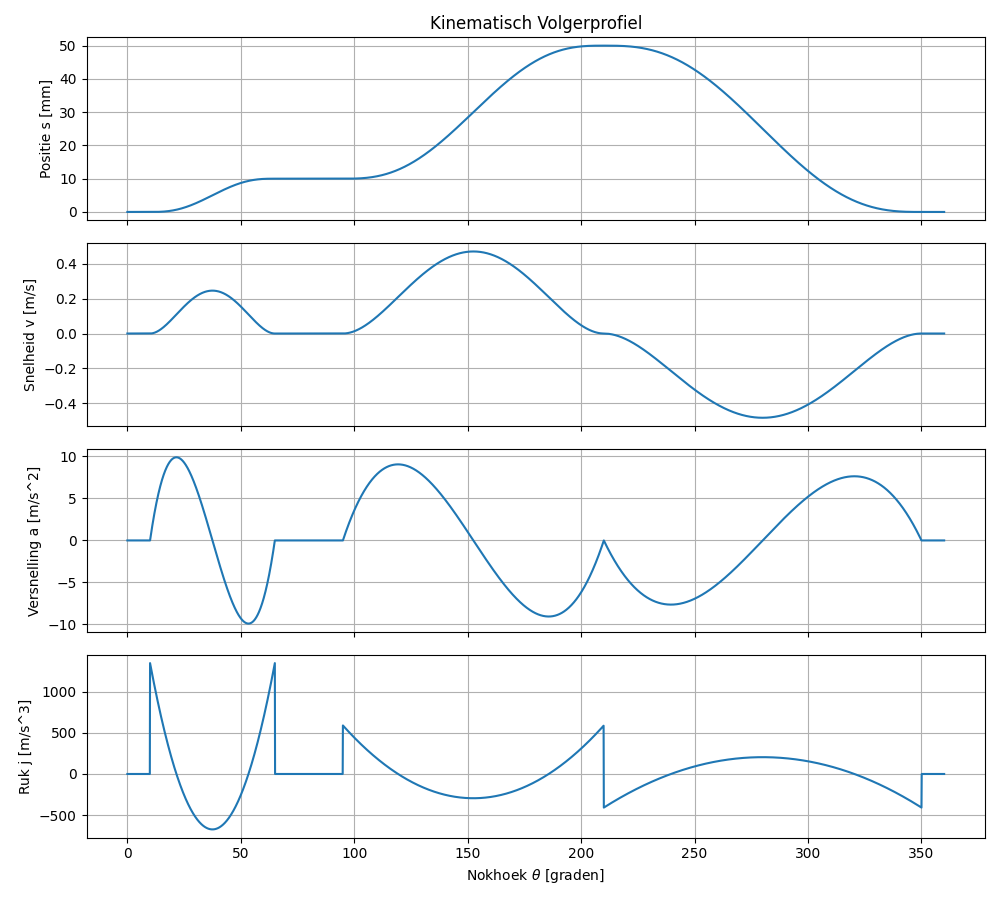

In [4]:
theta_deg = np.linspace(0, 360, 3601)  
theta_rad = np.deg2rad(theta_deg)
time_array = theta_rad / omega

def calc_kinematics_for_profile(theta_array, segments):
    s = np.zeros_like(theta_array)
    v = np.zeros_like(theta_array)
    a = np.zeros_like(theta_array)
    j = np.zeros_like(theta_array)
    
    for (start_hoek, eind_hoek, start_lift, eind_lift, type_wet) in segments:
        beta = eind_hoek - start_hoek
        if beta <= 0:
            beta += 360.0 
            
        beta_rad = np.deg2rad(beta)
        h = eind_lift - start_lift
        
        shifted_deg = (theta_array - start_hoek) % 360.0
        mask = (shifted_deg >= 0) & (shifted_deg <= beta)
        tau = shifted_deg[mask] / beta
        
        if type_wet == 'cycloid':
            y, dy, ddy, dddy = cycloid_law(tau)
        elif type_wet == 'poly5':
            y, dy, ddy, dddy = poly5_law(tau)
        else:
            y, dy, ddy, dddy = dwell_law(tau)
            
        s[mask] = start_lift + h * y
        if type_wet != 'dwell':
            v[mask] = (h / beta_rad) * dy * omega
            a[mask] = (h / (beta_rad**2)) * ddy * (omega**2)
            j[mask] = (h / (beta_rad**3)) * dddy * (omega**3)
            
    return s, v, a, j

profiel_segmenten = [
    (10,   65,  0.0,   0.010, 'poly5'), 
    (65,   95,  0.010, 0.010, 'dwell'), 
    (95,  210,  0.010, 0.050, 'poly5'),
    (210, 350,  0.050, 0.0,   'poly5'), 
    (350,  10,  0.0,   0.0,   'dwell')  
]

s_profiel, v_profiel, a_profiel, j_profiel = calc_kinematics_for_profile(theta_deg, profiel_segmenten)

fig, axes = plt.subplots(4, 1, figsize=(10, 9), sharex=True)
axes[0].plot(theta_deg, s_profiel * 1000)
axes[0].set_ylabel('Positie s [mm]')
axes[0].set_title('Kinematisch Volgerprofiel')
axes[0].grid(True)
axes[1].plot(theta_deg, v_profiel)
axes[1].set_ylabel('Snelheid v [m/s]')
axes[1].grid(True)
axes[2].plot(theta_deg, a_profiel)
axes[2].set_ylabel('Versnelling a [m/s^2]')
axes[2].grid(True)
axes[3].plot(theta_deg, j_profiel)
axes[3].set_ylabel('Ruk j [m/s^3]')
axes[3].set_xlabel(r'Nokhoek $\theta$ [graden]')
axes[3].grid(True)
plt.tight_layout()
plt.show()

### 4. Nokgeometrie: Drukhoek en Ondersnijding

#### 4a. Drukhoek $\alpha$

De drukhoek is de hoek tussen de **normaalkracht op de nok** en de **bewegingsrichting van de volger**. Met excentriciteit $e$:

$$\tan(\alpha) = \frac{\frac{ds}{d\theta} - e}{\sqrt{(R_0 + R_f)^2 - e^2} + s(\theta)}$$

**Richtwaarde:** $|\alpha| < 30°$. Bij grotere drukhoeken neemt de wrijvingskracht snel toe en kan de volger blokkeren (zelfblokkering).

> **Trade-off 1 — R₀ vergroten:** Een grotere basisstraal verkleint de drukhoek, maar neemt meer inbouwruimte en materiaalkosten. Itereer $R_0$ totdat $|\alpha|_{max} < 30°$.
>
> **Trade-off 2 — Excentriciteit e:** Het toevoegen van excentriciteit kan de drukhoek tijdens de **hefsslag** verlagen (asymmetrisch effect). Dit is "gratis" qua maatvoering maar maakt het mechanisme asymmetrisch: de drukhoek bij de terugkeerslag stijgt dan. Ideaal als de terugkeer minder kritisch is.

#### 4b. Lokale Kromtestraal $\rho$ en Ondersnijdingscheck

De kromtestraal van de **pitch curve** (het pad van het rollermiddelpunt) is:

$$\rho_{pitch} = \frac{\left(s_{tot}^2 + \left(\frac{ds}{d\theta} - e\right)^2\right)^{3/2}}{s_{tot}^2 + 2\left(\frac{ds}{d\theta} - e\right)^2 - s_{tot} \cdot \frac{d^2s}{d\theta^2}}$$

**Eis:** $\rho_{pitch} > R_f$ voor alle $\theta$. Als dit niet geldt $\rightarrow$ **ondersnijding**: de volger snijdt in het nokmateriaal en het mechanisme loopt vast.

> **Trade-off Rolstraal $R_f$:** Waarom niet zo klein mogelijk kiezen om ondersnijding te vermijden?
> - Te klein wiel → extreem **hoge contactspanning** (Hertz) → slijtage en vermoeiing
> - Te klein wiel → **geen ruimte voor een lager** in de volger → extra wrijving
> - Optimum: zo groot mogelijk zonder ondersnijding te veroorzaken


Evaluatie Ondersnijding:
 -> Positief: Geen ondersnijding theoretisch aanwezig binnen het ontwerp.


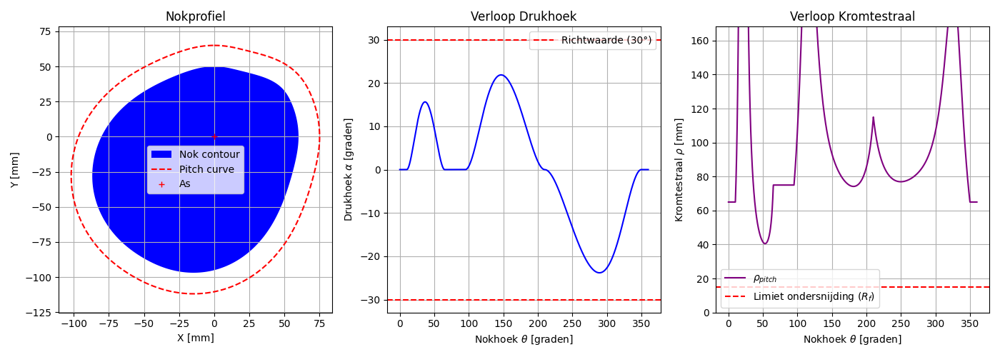

In [5]:
ds_dtheta = v_profiel / omega
d2s_dtheta2 = a_profiel / (omega**2)

s_base = np.sqrt((R_0 + R_f)**2 - e**2)
s_tot = s_base + s_profiel

alpha_rad = np.arctan((ds_dtheta - e) / s_tot)
alpha_deg = np.rad2deg(alpha_rad)

teller = (s_tot**2 + (ds_dtheta - e)**2)**(1.5)
noemer = s_tot**2 + 2*(ds_dtheta - e)**2 - s_tot * d2s_dtheta2
rho_pitch = teller / noemer

X_pitch = s_tot * np.sin(theta_rad) + e * np.cos(theta_rad)
Y_pitch = s_tot * np.cos(theta_rad) - e * np.sin(theta_rad)

X_nok = X_pitch - R_f * np.sin(theta_rad - alpha_rad)
Y_nok = Y_pitch - R_f * np.cos(theta_rad - alpha_rad)

# Numerieke controle op de theorethische limieten ten behoeve van mechanische kwaliteit
print("Evaluatie Ondersnijding:")
if np.any(rho_pitch <= R_f):
    print(" -> Fout: Ondersnijding vastgesteld. Mogelijke lockup en stoot te verwachten, rho_pitch is op minimaal 1 punt in de cyclus lokaal kleiner dan R_f.")
else:
    print(" -> Positief: Geen ondersnijding theoretisch aanwezig binnen het ontwerp.")

fig2, (ax_geom, ax_alpha, ax_rho) = plt.subplots(1, 3, figsize=(14, 5))
ax_geom.fill(X_nok * 1000, Y_nok * 1000, 'b', label='Nok contour')
ax_geom.plot(X_pitch * 1000, Y_pitch * 1000, '--r', label='Pitch curve')
ax_geom.plot(0, 0, 'r+', label='As')
ax_geom.axis('equal')
ax_geom.set_title('Nokprofiel')
ax_geom.set_xlabel('X [mm]')
ax_geom.set_ylabel('Y [mm]')
ax_geom.grid(True)
ax_geom.legend()

ax_alpha.plot(theta_deg, alpha_deg, color='blue')
ax_alpha.axhline(30, color='red', linestyle='--', label='Richtwaarde (30°)')
ax_alpha.axhline(-30, color='red', linestyle='--')
ax_alpha.set_xlabel(r'Nokhoek $\theta$ [graden]')
ax_alpha.set_ylabel(r'Drukhoek $\alpha$ [graden]')
ax_alpha.set_title('Verloop Drukhoek')
ax_alpha.grid(True)
ax_alpha.legend()

ax_rho.plot(theta_deg, rho_pitch * 1000, color='purple', label=r'$\rho_{pitch}$')
ax_rho.axhline(R_f * 1000, color='red', linestyle='--', label='Limiet ondersnijding ($R_f$)')
ax_rho.set_title('Verloop Kromtestraal')
ax_rho.set_ylim(0, max(np.median(rho_pitch)*2000, R_f*3000))
ax_rho.set_xlabel(r'Nokhoek $\theta$ [graden]')
ax_rho.set_ylabel(r'Kromtestraal $\rho$ [mm]')
ax_rho.grid(True)
ax_rho.legend()
plt.tight_layout()
plt.show()

### 5. Inverse Dynamica: Krachtenbalans

Via d'Alembert's principe schrijven we de evenwichtsvergelijking in de bewegingsrichting van de volger:

$$F_{nok,vert} = F_{inertie} + F_{demping} + F_{zwaartekracht} + F_{veer} + F_{extern}$$

met:
- $F_{inertie} = m \cdot \ddot{s}$
- $F_{demping} = c \cdot \dot{s}$
- $F_{zwaartekracht} = m \cdot g$
- $F_{veer} = k \cdot s + F_{preload}$
- $F_{extern}$: opgelegde productiekracht

De **normaalkracht** (loodrecht op het nokoppervlak) en **wrijvingskracht** (langs het oppervlak) volgen dan:

$$F_{normaal} = \frac{F_{nok,vert}}{\cos(\alpha) - \mu \cdot \text{sgn}(\dot{s}) \cdot \sin(\alpha)}$$

$$F_{wrijving} = \mu \cdot F_{normaal} \cdot |\tan(\alpha)| \cdot \text{sgn}(\dot{s})$$

> **Veerontwerp (mondelinge vraag):** Hoe kies je $F_{preload}$?
> De voorspanning moet **net groot genoeg** zijn zodat $F_{normaal} > 0$ overal in de cyclus (geen zweefgedrag). Te hoog kiezen is nefast: de normaalkracht stijgt onnodig, wat meer **wrijvingsverliezen** en een **grotere motorbelasting** geeft. In de praktijk kies je $F_{preload}$ zodat $\min(F_{normaal}) \approx 50{-}100$ N als veiligheidsmarge.


Beoordeling Veer Capaciteit:
 -> Normaalkracht analyse (meest laag gedaalde drukwaarde): 784.49 N
 -> Analytische conclusie: Het ontwerp is robuust. De veer verhindert structureel wegslaan van de volger.


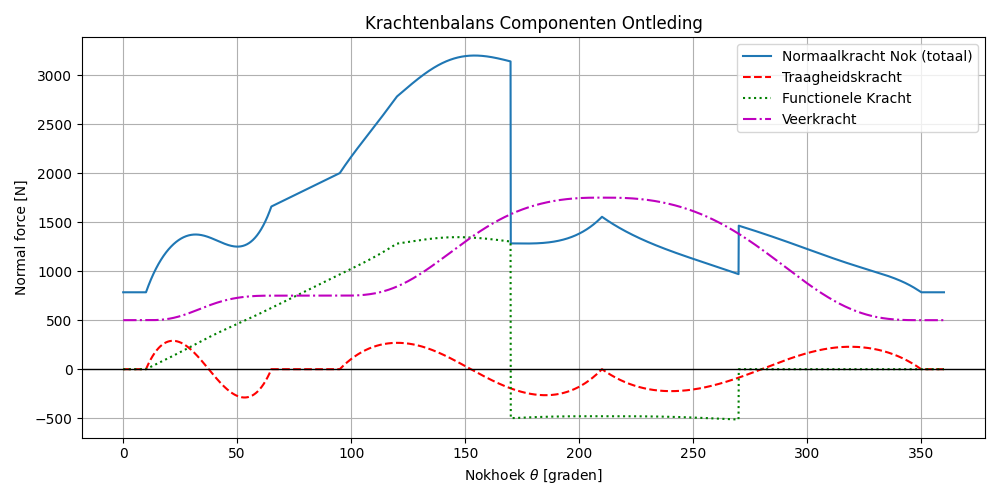

In [6]:
F_functioneel = np.zeros_like(theta_deg)
for i, th in enumerate(theta_deg):
    th_wrap = th % 360.0
    if 10 <= th_wrap < 120:
        F_functioneel[i] = (th_wrap - 10) / (120 - 10) * 1250.0
    elif 120 <= th_wrap < 170:
        F_functioneel[i] = 1250.0
    elif 170 <= th_wrap < 270:
        F_functioneel[i] = -480.0
    else:
        F_functioneel[i] = 0.0

F_in = m_volger * a_profiel
F_demping = c_demping * v_profiel
F_zwaar = m_volger * g
F_veer = k_veer * s_profiel + F_preload

# Neerwaartse kracht positief georiënteerd m.b.t het coördinatenstelsel van de theorie
F_som = F_in + F_demping + F_zwaar + F_veer + F_functioneel

F_nok_verticaal = np.zeros_like(theta_deg)
F_wrijving = np.zeros_like(theta_deg)
F_normaal_nok = np.zeros_like(theta_deg)

for i in range(len(theta_deg)):
    V_sign = np.sign(v_profiel[i]) if v_profiel[i] != 0 else 0
    noemer_wrijving = 1.0 - mu * np.abs(np.tan(alpha_rad[i])) * V_sign
    F_nok_verticaal[i] = F_som[i] / noemer_wrijving
    F_wrijving[i] = mu * F_nok_verticaal[i] * np.abs(np.tan(alpha_rad[i])) * V_sign
    F_normaal_nok[i] = F_nok_verticaal[i] / np.cos(alpha_rad[i])

min_contact_force = np.min(F_normaal_nok)
print("Beoordeling Veer Capaciteit:")
print(f" -> Normaalkracht analyse (meest laag gedaalde drukwaarde): {min_contact_force:.2f} N")
if min_contact_force <= 0:
    print(" -> Analytische conclusie: De theorethische veerstijfheid of haar pre-spanning schiet tekort. De volger zal ontkoppelen (zweefgedrag).")
else:
    print(" -> Analytische conclusie: Het ontwerp is robuust. De veer verhindert structureel wegslaan van de volger.")

fig3, ax_force = plt.subplots(figsize=(10, 5))
ax_force.plot(theta_deg, F_normaal_nok, label='Normaalkracht Nok (totaal)')
ax_force.plot(theta_deg, F_in / np.cos(alpha_rad), '--r', label='Traagheidskracht')
ax_force.plot(theta_deg, F_functioneel / np.cos(alpha_rad), ':g', label='Functionele Kracht')
ax_force.plot(theta_deg, F_veer / np.cos(alpha_rad), '-.m', label='Veerkracht')
ax_force.axhline(0, color='k', linewidth=1.0)
ax_force.set_ylabel('Normal force [N]')
ax_force.set_xlabel(r'Nokhoek $\theta$ [graden]')
ax_force.set_title('Krachtenbalans Componenten Ontleding')
ax_force.grid(True)
ax_force.legend()
plt.tight_layout()
plt.show()

### 6. Aandrijfvermogen en Vliegwielontwerp

Het **aandrijfkoppel** op de nok-as volgt uit virtuele arbeid:

$$M(\theta) = F_{nok,vert} \cdot \frac{ds}{d\theta}$$

Het **gemiddeld vermogen** is:
$$P_{gem} = \frac{1}{2\pi} \int_0^{2\pi} M(\theta)\,\omega\,d\theta$$

#### Vliegwiel

Het vliegwiel absorbeert de **energiefluctuatie** $\Delta E$ tussen het gemiddeld koppel en het werkelijk koppel:
$$I_{vliegwiel} = \frac{\Delta E}{K_{gewenst} \cdot \omega^2}$$

waarbij $K_{gewenst} = 0.05$ de maximale toelaatbare snelheidsfluctuatie als fractie van $\omega$ is.

> **Mondelinge vraag — "Wat als T_cyclus = 0.25s (2× sneller)?"**
> - Het geometrisch nokprofiel **verandert niet**: $s(\theta)$ is puur geometrisch
> - $\omega$ verdubbelt → versnellingen stijgen **kwadratisch** ($\ddot{s} \propto \omega^2$)
> - Inertiële krachten verdubbelen kwadratisch → motor moet **4× meer koppelvermogen** leveren
> - Het vliegwiel moet ook groter: $I \propto \omega^{-2}$ (paradoxaal: kleinere $I$ nodig, maar het koppel is groter)
> - **Beter alternatief?** Twee machines parallel → elk aan halve snelheid, kwart van de krachten


Analyse en Capaciteit Specificaties tbv Aandrijving:
 -> Gemiddeld Theorethisch Model Vermogen (P_gemiddeld)                : 113.15 W
 -> Analoog Nominale Koppel As-Belasting (M_gemiddeld)               : 9.00 Nm
 -> Maximale Fluctuatie Cyclus Uitslag op Energie (Delta E)          : 84.97 J
 -> Tolerantie Conform Berekend Component Vliegwiel Traagheid (I)    : 10.7614 kg·m^2


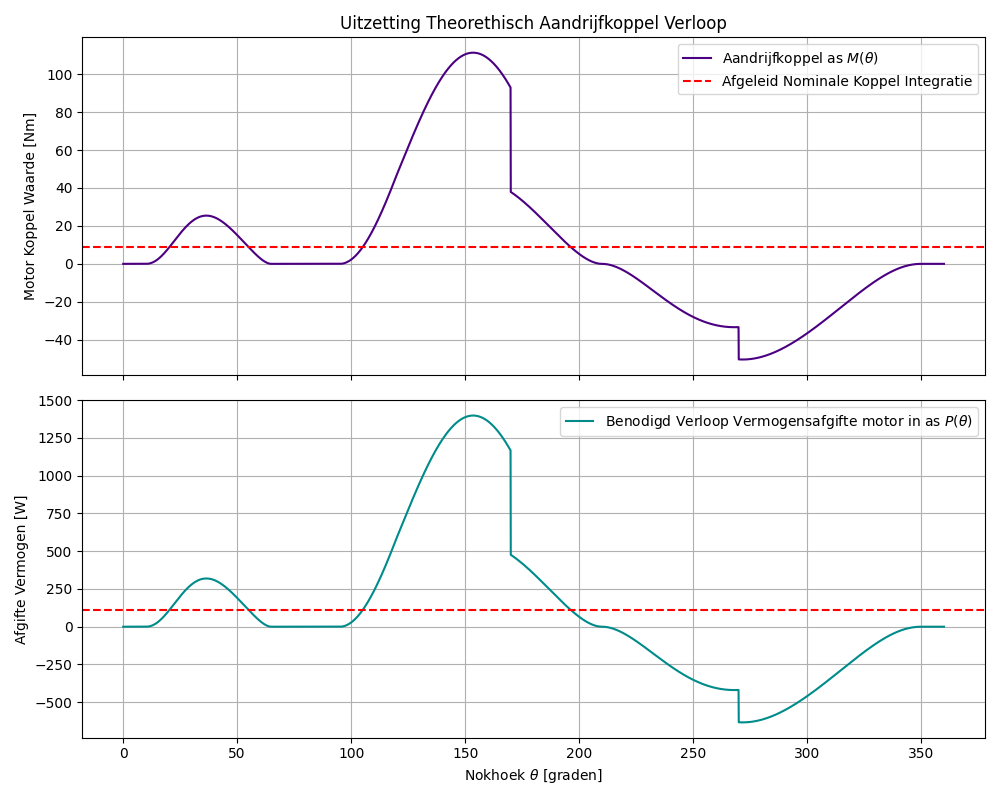

In [7]:
M_aandrijf = F_nok_verticaal * (v_profiel / omega)
P_aandrijf = M_aandrijf * omega

# Compatabiliteit verzekerd met gebruikmakend van 'trapezoid' in plaats van de NumPy 1.x specifieke 'trapz' afgeleiden, opdat er geen fout ontstaat bij moderne evaluatie pakketten NumPy 2.x
P_gemiddeld = np.trapezoid(P_aandrijf, theta_rad) / (2 * np.pi)
M_gemiddeld = P_gemiddeld / omega

dtheta_rad = theta_rad[1] - theta_rad[0]
E_fluct = np.cumsum((M_aandrijf - M_gemiddeld) * dtheta_rad)
Delta_E = np.max(E_fluct) - np.min(E_fluct)
I_vliegwiel = Delta_E / (K_gewenst * omega**2)

print("Analyse en Capaciteit Specificaties tbv Aandrijving:")
print(f" -> Gemiddeld Theorethisch Model Vermogen (P_gemiddeld)                : {P_gemiddeld:.2f} W")
print(f" -> Analoog Nominale Koppel As-Belasting (M_gemiddeld)               : {M_gemiddeld:.2f} Nm")
print(f" -> Maximale Fluctuatie Cyclus Uitslag op Energie (Delta E)          : {Delta_E:.2f} J")
print(f" -> Tolerantie Conform Berekend Component Vliegwiel Traagheid (I)    : {I_vliegwiel:.4f} kg·m^2")

fig4, (ax_torque, ax_power) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)
ax_torque.plot(theta_deg, M_aandrijf, label=r'Aandrijfkoppel as $M(\theta)$', color='indigo')
ax_torque.axhline(M_gemiddeld, color='r', linestyle='--', label=r'Afgeleid Nominale Koppel Integratie')
ax_torque.set_ylabel('Motor Koppel Waarde [Nm]')
ax_torque.set_title('Uitzetting Theorethisch Aandrijfkoppel Verloop')
ax_torque.grid(True)
ax_torque.legend()

ax_power.plot(theta_deg, P_aandrijf, label=r'Benodigd Verloop Vermogensafgifte motor in as $P(\theta)$', color='darkcyan')
ax_power.axhline(P_gemiddeld, color='r', linestyle='--')
ax_power.set_ylabel('Afgifte Vermogen [W]')
ax_power.set_xlabel(r'Nokhoek $\theta$ [graden]')
ax_power.grid(True)
ax_power.legend()
plt.tight_layout()
plt.show()

### 7. Trillingsanalyse (FFT + 1-DOF Respons)

De versnellingscurve $\ddot{s}(\theta)$ is een **periodische excitatie** van het veer-massa-demper systeem. Via FFT decomponeren we dit signaal in harmonischen:

$$\ddot{s}(t) = \sum_{n=0}^{N} A_n \cos(n \omega t + \phi_n)$$

Elke harmonische $n$ exciteert het systeem met kracht $F_n = m \cdot A_n$. De amplitude van de responsverplaatsing is:

$$Z_n = \frac{F_n}{\sqrt{(k - m(n\omega)^2)^2 + (c \cdot n\omega)^2}}$$

**Gevaar:** Als $n \cdot \omega \approx \omega_n = \sqrt{k/m}$ voor een significante harmonische \rightarrow **resonantie**.

> **Mondelinge vraag — "Waarom is de FFT van de versnelling (en niet de positie) relevant?"**
> De inertiële kracht $F = m\ddot{s}$ is de daadwerkelijke excitatie op het systeem. Een gladde positiecurve kan toch hoge-frequentiecomponenten in de versnelling hebben (bijv. door discontinuïteiten in $\dddot{s}$ bij segmentovergangen), die dan resonantie kunnen veroorzaken.
>
> **Eigenfrequentie van het systeem:** $f_n = \frac{1}{2\pi}\sqrt{\frac{k}{m}} = \frac{1}{2\pi}\sqrt{\frac{25000}{29}} \approx$ **4.7 Hz**. De machine draait aan $f = 1/T_{cyclus} = 2$ Hz. De 3e harmonische (6 Hz) ligt dicht bij $f_n$ → aandachtspunt!


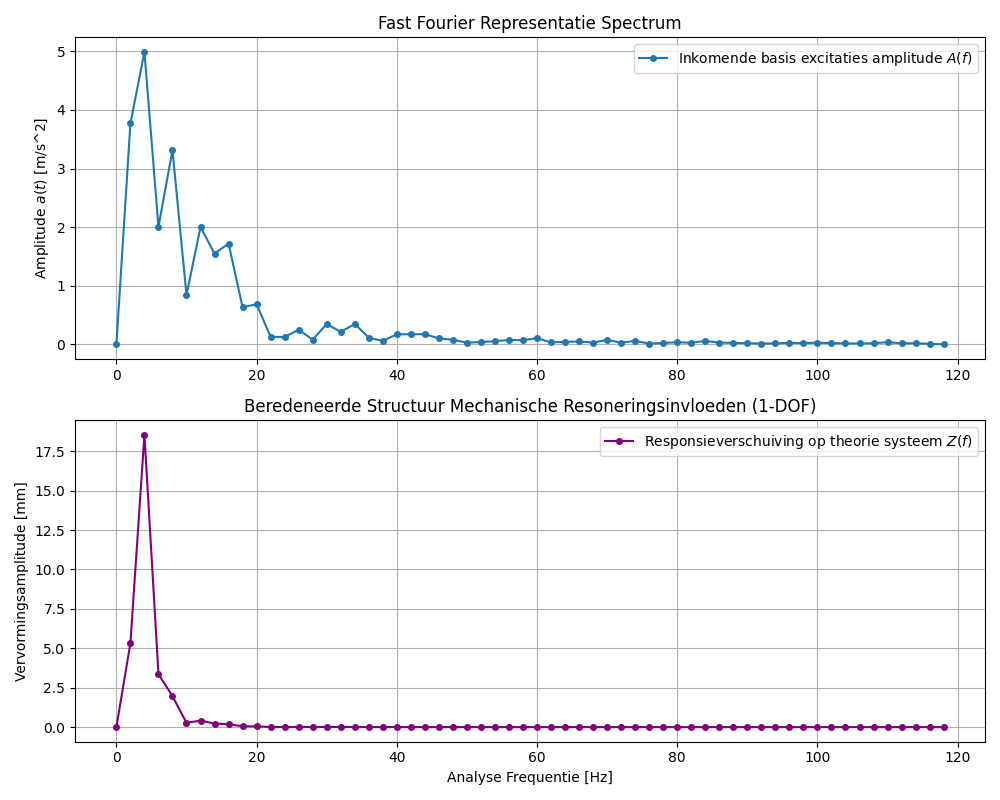

In [8]:
N = len(time_array)
dt = T_cyclus / N

a_fft = fft(a_profiel)
freq = fftfreq(N, dt)

mask_pos = freq >= 0
freq_pos = freq[mask_pos]
a_fft_pos = np.abs(a_fft[mask_pos]) * 2.0 / N
a_fft_pos[0] = a_fft_pos[0] / 2.0  

omega_f = 2 * np.pi * freq_pos
Z_amp = np.zeros_like(freq_pos)

for i in range(len(freq_pos)):
    F_amp_inertieel = m_volger * a_fft_pos[i]
    if F_amp_inertieel > 0:
        noemer_tf = np.sqrt((k_veer - m_volger * omega_f[i]**2)**2 + (c_demping * omega_f[i])**2)
        Z_amp[i] = F_amp_inertieel / noemer_tf

fig5, (ax_fft1, ax_fft2) = plt.subplots(2, 1, figsize=(10, 8))
ax_fft1.plot(freq_pos[:60], a_fft_pos[:60], 'o-', markersize=4, label='Inkomende basis excitaties amplitude $A(f)$')
ax_fft1.set_ylabel('Amplitude $a(t)$ [m/s^2]')
ax_fft1.set_title('Fast Fourier Representatie Spectrum')
ax_fft1.grid(True)
ax_fft1.legend()

ax_fft2.plot(freq_pos[:60], Z_amp[:60] * 1000, 'o-', markersize=4, color='purple', label=r'Responsieverschuiving op theorie systeem $Z(f)$')
ax_fft2.set_ylabel('Vervormingsamplitude [mm]')
ax_fft2.set_xlabel('Analyse Frequentie [Hz]')
ax_fft2.set_title('Beredeneerde Structuur Mechanische Resoneringsinvloeden (1-DOF)')
ax_fft2.grid(True)
ax_fft2.legend()
plt.tight_layout()
plt.show()

### 8. Kinematische Animatie

De animatie toont de roterende nok (blauw profiel) en de translerende rolvolger (groene cirkel + stang). De volger volgt het nokprofiel doordat de verticale positie $Y_{center}$ bij elke frame geïnterpoleerd wordt uit $s(\theta)$:

$$Y_{center}(\theta) = \sqrt{(R_0 + R_f)^2 - e^2} + s(\theta)$$

Tegelijkertijd roteert het nokcontour $(X_{nok}, Y_{nok})$ met hoek $\theta$ om het centrum.

> **Let op:** De nok roteert in het **inertiestelsel**, terwijl de contour oorspronkelijk berekend is in het **nokvaste stelsel** (bij $\theta = 0$). De rotatietransformatie zet de contour terug naar het globale stelsel voor elke animatieframe.


In [9]:
fig_ani, ax_ani = plt.subplots(figsize=(7, 7))
ax_ani.set_aspect('equal')
ax_ani.grid(True)
ax_ani.set_xlabel('Mechanische Frame Afstand as X [m]')
ax_ani.set_ylabel('Mechanische Frame Afstand as Y [m]')
ax_ani.set_title('Kinematische Vector 2D Validatie Rotatie')

lim_zone = R_0 + R_f + max(s_profiel) * 1.5
ax_ani.set_xlim(-lim_zone, lim_zone)
ax_ani.set_ylim(-lim_zone, lim_zone)

cam_patch, = ax_ani.plot([], [], 'b-', lw=2, label='Afwikkeling nok profiel geometrie')
volger_roller = plt.Circle((0, 0), R_f, color='green', fill=False, lw=3)
ax_ani.add_patch(volger_roller)
volger_stem, = ax_ani.plot([], [], 'k-', lw=5, label='Translerende volger component element assenstelsel')
ax_ani.legend(loc="upper left")

aantal_frames = 250
theta_anim = np.linspace(0, 4 * np.pi, aantal_frames)

def init_anim():
    cam_patch.set_data([], [])
    volger_roller.center = (e, s_base)
    volger_stem.set_data([], [])
    return cam_patch, volger_roller, volger_stem

def frame_update(i):
    angle = theta_anim[i]
    
    cos_a = np.cos(-angle)
    sin_a = np.sin(-angle)
    
    x_rot = X_nok * cos_a - Y_nok * sin_a
    y_rot = X_nok * sin_a + Y_nok * cos_a
    cam_patch.set_data(x_rot, y_rot)
    
    theta_deg_cur = (-np.rad2deg(angle)) % 360.0
    s_huidig = np.interp(theta_deg_cur, theta_deg, s_profiel)
    Y_center = s_base + s_huidig
    
    volger_roller.center = (e, Y_center)
    volger_stem.set_data([e, e], [Y_center + R_f, Y_center + R_f + 0.05])
    
    return cam_patch, volger_roller, volger_stem

from IPython.display import HTML, display
ani = animation.FuncAnimation(fig_ani, frame_update, frames=aantal_frames, init_func=init_anim, blit=True, interval=30)
plt.close(fig_ani)  # Sluit de statische plot om dubbele weergave te voorkomen
display(HTML(ani.to_jshtml()))
